<a href="https://colab.research.google.com/github/PUBPOL-2130/notebooks/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%config InlineBackend.figure_formats = ["retina"]

In [2]:
!pip install -q geopandas seaborn folium census

# Redlining

In [3]:
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from branca.utilities import color_brewer
from census import Census

In [4]:
census = Census("", year=2020)

We'll be pulling data (and inspiration) from the extraordinary University of Richmond project on redlining called [Mapping Inequality](https://dsl.richmond.edu/panorama/redlining/).  You should absolutely check out their stuff and click around.

In [5]:
areas_gdf = gpd.read_file("https://dsl.richmond.edu/panorama/redlining/static/mappinginequality.gpkg")

In [6]:
areas_gdf

,area_id,city,state,city_survey,category,grade,label,residential,commercial,industrial,fill,geometry
0,244,Birmingham,AL,True,Best,A,A1,True,False,False,#76a865,"MULTIPOLYGON (((-86.75678 33.49754, -86.75653 ..."
1,193,Birmingham,AL,True,Best,A,A2,True,False,False,#76a865,"MULTIPOLYGON (((-86.75867 33.50933, -86.76134 ..."
2,206,Birmingham,AL,True,Best,A,A3,True,False,False,#76a865,"MULTIPOLYGON (((-86.75678 33.49754, -86.75692 ..."
3,203,Birmingham,AL,True,Still Desirable,B,B1,True,False,False,#7cb5bd,"MULTIPOLYGON (((-86.80111 33.48071, -86.80505 ..."
4,189,Birmingham,AL,True,Still Desirable,B,B10,True,False,False,#7cb5bd,"MULTIPOLYGON (((-86.74923 33.53333, -86.74971 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
10149,6518,Wheeling,WV,True,Hazardous,D,D4,True,False,False,#d9838d,"MULTIPOLYGON (((-80.71985 40.06376, -80.71943 ..."
10150,6520,Wheeling,WV,True,Hazardous,D,D5,True,False,False,#d9838d,"MULTIPOLYGON (((-80.72854 40.06729, -80.7287 4..."
10151,6516,Wheeling,WV,True,Hazardous,D,D6,True,False,False,#d9838d,"MULTIPOLYGON (((-80.72216 40.06134, -80.72247 ..."
10152,6512,Wheeling,WV,True,Hazardous,D,D7,True,False,False,#d9838d,"MULTIPOLYGON (((-80.6474 40.04886, -80.64842 4..."


Now we'll grab a dataset of redlining grades transfered onto U.S. census tracts from what's called the HRI (Historical Redlining Indicator).  

Meier, Helen C.S., and Mitchell, Bruce C. . Historic Redlining Indicator for 2000, 2010, and 2020 US Census Tracts. Ann Arbor, MI: Inter-university Consortium for Political and Social Research [distributor], 2023-09-25. https://doi.org/10.3886/E141121V3
(see [ICPSR](https://www.openicpsr.org/openicpsr/project/141121/version/V3/view?path=/openicpsr/141121/fcr:versions/V3.2&type=project))

In [7]:
hri_gdf = gpd.read_file("https://raw.githubusercontent.com/PUBPOL-2130/notebooks/refs/heads/main/data/HRI2020.zip")

In [8]:
hri_gdf

,OBJECTID_1,OBJECTID,GEOID20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,CBSA10,METRO_NAME,Shape_Leng,EQINTER20,Shape_Le_1,Shape_Area,HRI2020,RHRI2020,geometry
0,0,1,01097001502,848502.0,0.0,+30.6568785,-088.0688375,33681.0,"Mobile, AL",0.043989,4,0.043989,0.000080,3.924200,3.9,"POLYGON ((-88.07488 30.64997, -88.07459 30.650..."
1,0,3,01073004502,2953269.0,0.0,+33.5071040,-086.8031176,13820.0,"Birmingham-Hoover, AL",0.077309,4,0.077309,0.000287,3.939468,3.9,"POLYGON ((-86.81747 33.50731, -86.8174 33.5073..."
2,0,4,01073004501,723960.0,0.0,+33.4983380,-086.8072523,13820.0,"Birmingham-Hoover, AL",0.039856,4,0.039856,0.000070,3.551947,3.6,"POLYGON ((-86.81556 33.49672, -86.81517 33.497..."
3,0,6,01073002402,4990907.0,0.0,+33.5299121,-086.7865984,13820.0,"Birmingham-Hoover, AL",0.102104,4,0.102104,0.000484,3.997646,4.0,"POLYGON ((-86.80414 33.52829, -86.80397 33.528..."
4,0,7,01073002401,3488479.0,0.0,+33.5209629,-086.7775618,13820.0,"Birmingham-Hoover, AL",0.101521,4,0.101521,0.000339,3.751425,3.8,"POLYGON ((-86.79666 33.5172, -86.79389 33.5185..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13483,0,16596,55079007900,534569.0,24150.0,+43.0661920,-087.8957527,33340.0,"Milwaukee-Waukesha-West Allis,",0.037109,4,0.037109,0.000062,3.956915,4.0,"POLYGON ((-87.9004 43.06418, -87.90038 43.0652..."
13484,0,16597,55079008000,326024.0,0.0,+43.0674802,-087.9028298,33340.0,"Milwaukee-Waukesha-West Allis,",0.024456,4,0.024456,0.000036,4.000000,4.0,"POLYGON ((-87.90534 43.06421, -87.90533 43.065..."
13485,0,16598,55079007700,679121.0,21023.0,+43.0649318,-087.8886201,33340.0,"Milwaukee-Waukesha-West Allis,",0.038491,3,0.038491,0.000077,3.000000,3.0,"POLYGON ((-87.89505 43.06792, -87.89497 43.067..."
13486,0,16599,55079008100,278881.0,0.0,+43.0674717,-087.9074384,33340.0,"Milwaukee-Waukesha-West Allis,",0.023043,4,0.023043,0.000031,3.650345,3.7,"POLYGON ((-87.90961 43.06425, -87.9096 43.0653..."


Let's look at NYC!

In [9]:
queens_bronx_areas_gdf = areas_gdf[(areas_gdf["city"] == "Queens") | (areas_gdf["city"] == "Bronx")].copy()
queens_bronx_areas_gdf["score"] = queens_bronx_areas_gdf["grade"].map({"A": 3, "B": 2, "C": 1, "D": 0})
queens_bronx_areas_gdf

,area_id,city,state,city_survey,category,grade,label,residential,commercial,industrial,fill,geometry,score
6271,2736,Bronx,NY,True,Best,A,A1,True,False,False,#76a865,"MULTIPOLYGON (((-73.90345 40.91062, -73.90615 ...",3.0
6272,2738,Bronx,NY,True,Best,A,A2,True,False,False,#76a865,"MULTIPOLYGON (((-73.89916 40.89286, -73.89949 ...",3.0
6273,2737,Bronx,NY,True,Still Desirable,B,B1,True,False,False,#7cb5bd,"MULTIPOLYGON (((-73.90652 40.9006, -73.90522 4...",2.0
6274,2764,Bronx,NY,True,Still Desirable,B,B10,True,False,False,#7cb5bd,"MULTIPOLYGON (((-73.85101 40.85032, -73.84922 ...",2.0
6275,2775,Bronx,NY,True,Still Desirable,B,B11,True,False,False,#7cb5bd,"MULTIPOLYGON (((-73.83816 40.85735, -73.83685 ...",2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6812,2472,Queens,NY,True,Hazardous,D,D6,True,False,False,#d9838d,"MULTIPOLYGON (((-73.85912 40.75063, -73.86101 ...",0.0
6813,2473,Queens,NY,True,Hazardous,D,D7,True,False,False,#d9838d,"MULTIPOLYGON (((-73.85262 40.75252, -73.85424 ...",0.0
6814,2475,Queens,NY,True,Hazardous,D,D8,True,False,False,#d9838d,"MULTIPOLYGON (((-73.85494 40.74337, -73.8572 4...",0.0
6815,2474,Queens,NY,True,Hazardous,D,D9,True,False,False,#d9838d,"MULTIPOLYGON (((-73.85494 40.74337, -73.85476 ...",0.0


Not a lot of grade A terrain in Queens and the Bronx!

In [10]:
queens_bronx_areas_gdf["grade"].value_counts()

,count
grade,
C,134
D,46
B,28
A,3
E,1


In [11]:
queens_bronx_map = folium.Map([40.65, -73.95], zoom_start=12)
queens_bronx_choro = folium.Choropleth(
    geo_data=queens_bronx_areas_gdf,
    name="choropleth",
    data=queens_bronx_areas_gdf,
    columns=["area_id", "score"],
    key_on="feature.properties.area_id",
    fill_color="RdYlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Historic Redlining Indicator",
)
queens_bronx_choro.color_scale.colors = list(reversed(queens_bronx_choro.color_scale.colors))
queens_bronx_choro.add_to(queens_bronx_map)
queens_bronx_map

We can grab data for three metro areas.

In [12]:
metro_areas = {
    "NYC": hri_gdf[hri_gdf["METRO_NAME"] == "New York-Newark-Jersey City, N"],
    "LA": hri_gdf[hri_gdf["METRO_NAME"] == "Los Angeles-Long Beach, CA"],
    "Houston": hri_gdf[hri_gdf["GEOID20"].str.startswith("48201")]
}

In [28]:
def plot_hri(gdf, center, zoom):
    hri_map = folium.Map(center, zoom_start=zoom)

    # ensure colors
    def reverse_color_brewer(*args, **kwargs):
        return list(reversed(color_brewer(*args, **kwargs)))

    folium.features.color_brewer = reverse_color_brewer
    choro = folium.Choropleth(
        geo_data=gdf,
        name="choropleth",
        data=gdf,
        columns=["GEOID20", "HRI2020"],
        key_on="feature.properties.GEOID20",
        fill_color="RdYlGn",
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name="Historic Redlining Indicator",
    )
    folium.features.color_brewer = color_brewer
    choro.add_to(hri_map)
    return hri_map

In [14]:
plot_hri(metro_areas["NYC"], center=[40.65, -73.95], zoom=12)

In [15]:
plot_hri(metro_areas["LA"], center=[34.06, -118.25], zoom=11)

In [16]:
plot_hri(metro_areas["Houston"], center=[29.76, -95.36], zoom=12)

Now we'll start some data prep to attach income information to the dataframe, so we can compare old redlining with persistent wealth/income gaps.

In [17]:
counties_by_metro_area = {
    metro_area: set(gdf["GEOID20"].str.slice(0, 5))
    for metro_area, gdf in metro_areas.items()
}
counties = set.union(*counties_by_metro_area.values())

In [18]:
median_income_raw = []
for county_fips in counties:
    print(county_fips)
    median_income_raw += census.acs5.get(
        (
            "B06011_001E",  # median income
        ),
        geo={
            "for": "tract:*",
            "in": f"state:{county_fips[:2]} county:{county_fips[2:]}",
        },
        year=2022,
    )

36119
36047
48201
36081
06037
36061
34013
36005
34039
34003
34017
36085
34035


In [19]:
median_income_df = pd.DataFrame(median_income_raw).rename(
    columns={
        "B06011_001E": "median_income",
    }
)
median_income_df["geoid"] = (
    median_income_df["state"]
    + median_income_df["county"]
    + median_income_df["tract"]
)
median_income_df = median_income_df.set_index("geoid")
median_income_df = median_income_df[median_income_df["median_income"] > 0]  # filter out negative sentinel values

Let's make a scatterplot of housing grades vs. current income levels.

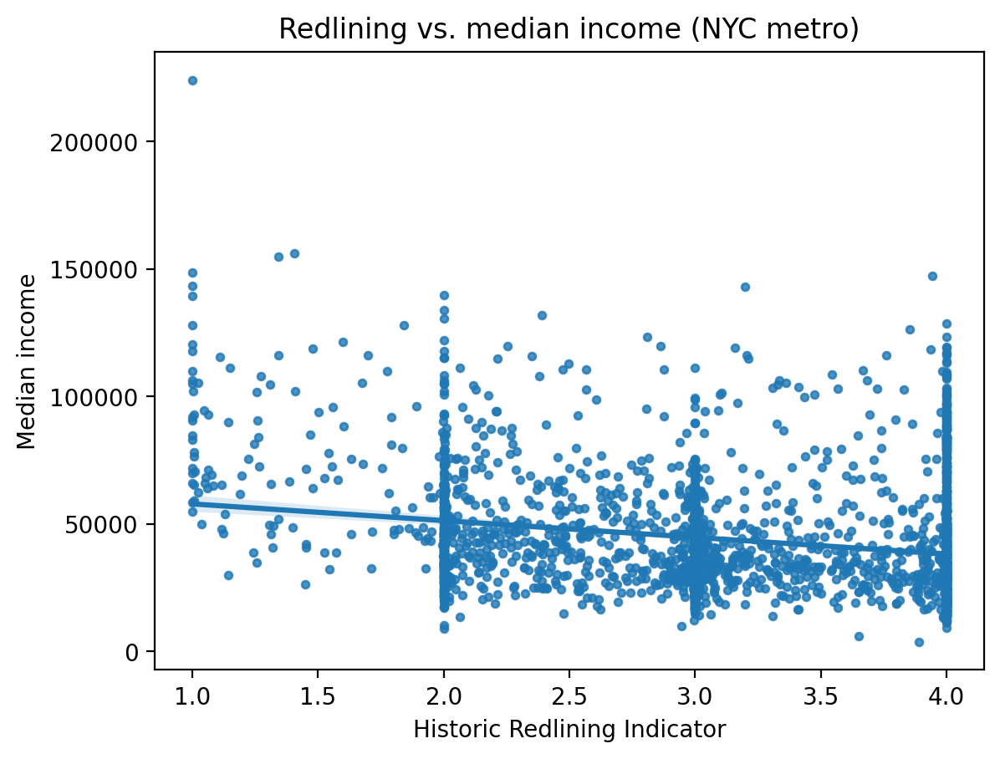

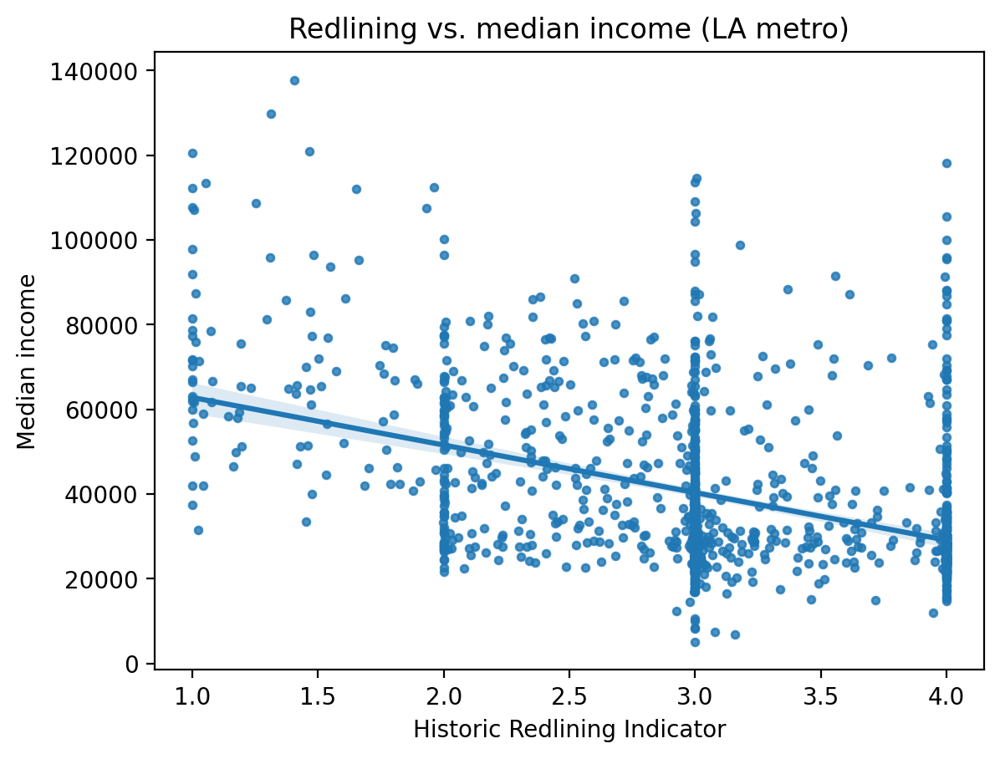

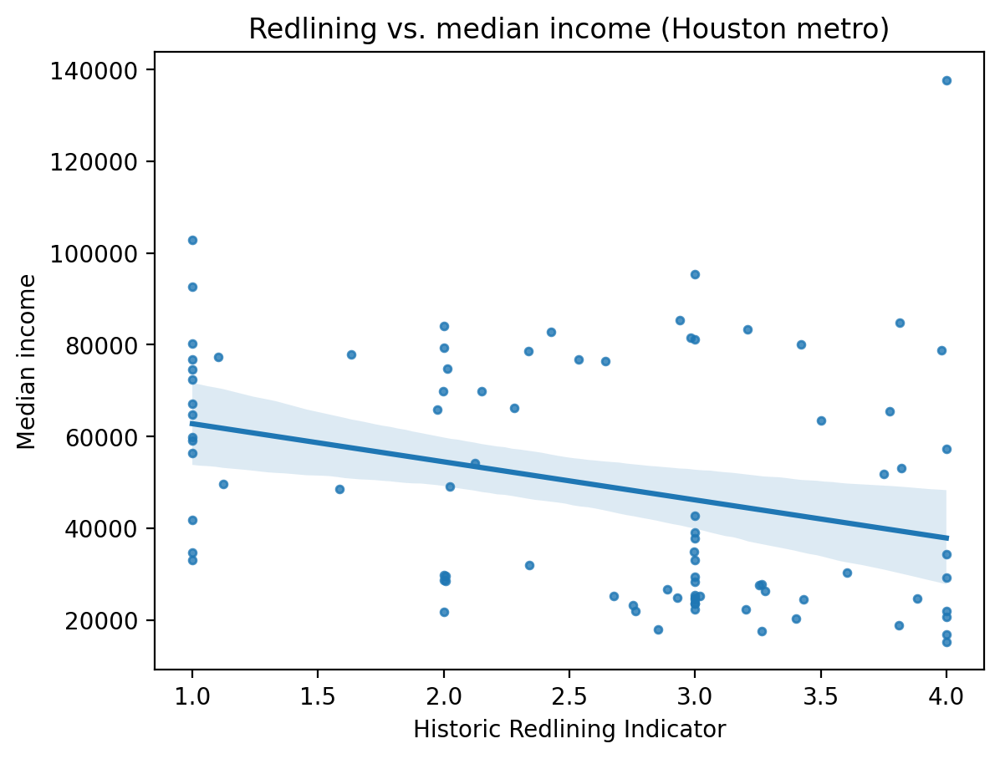

In [20]:
for label, gdf in metro_areas.items():
    sns.regplot(
        data=median_income_df.join(gdf.set_index("GEOID20")["HRI2020"]),
        x="HRI2020",
        y="median_income",
        scatter_kws={"s": 10},
    )
    plt.xlabel("Historic Redlining Indicator")
    plt.ylabel("Median income")
    plt.title(f"Redlining vs. median income ({label} metro)")
    plt.show()

Next, we'll bring back "KDE plots," which are smooth curves that capture some of the information in a distribution in an intuitive way.  Let's look at NYC, LA, and Houston and examine the distribution of median income.

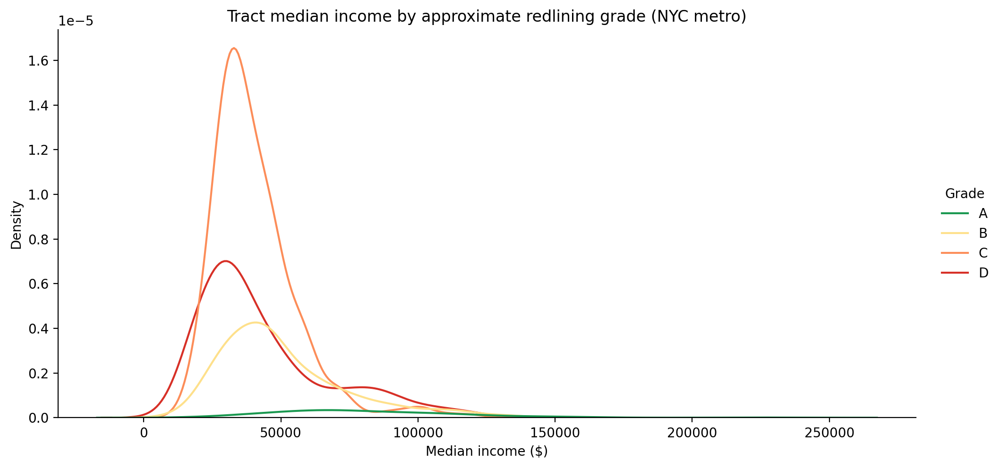

Medians of median income by grade:
Grade
A    72141.0
B    45383.0
C    36914.0
D    35391.0
Name: median_income, dtype: float64


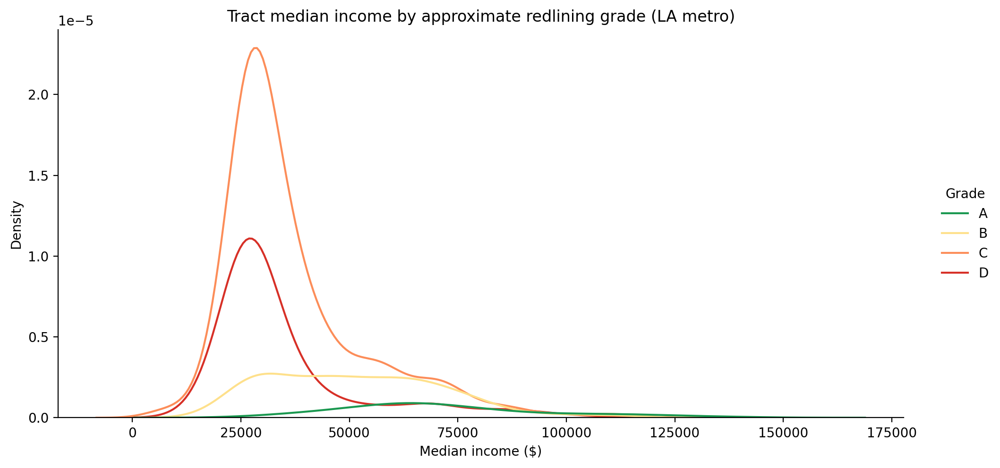

Medians of median income by grade:
Grade
A    66031.5
B    49874.0
C    30894.0
D    28491.0
Name: median_income, dtype: float64


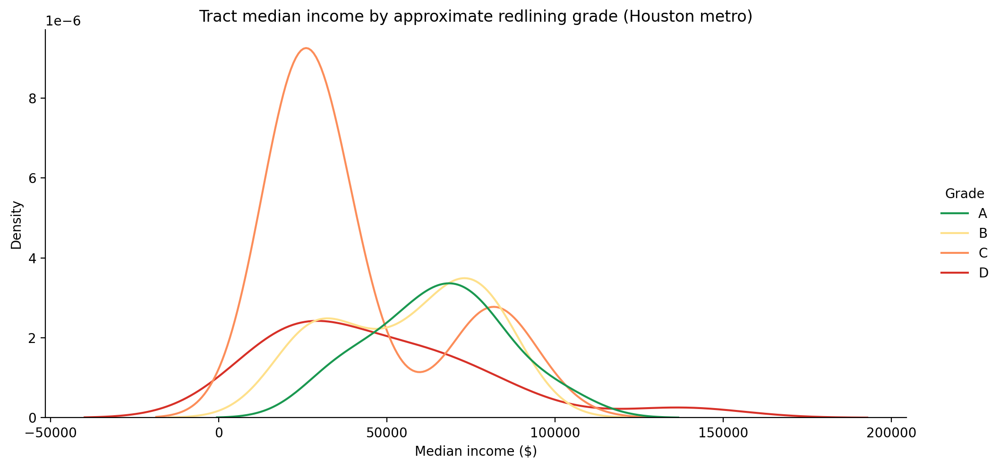

Medians of median income by grade:
Grade
A    65935.0
B    65796.0
C    26599.0
D    34291.0
Name: median_income, dtype: float64


In [21]:
displot_palette = list(reversed(color_brewer("RdYlGn")[:3] + color_brewer("RdYlGn")[5:]))

for label, gdf in metro_areas.items():
    df = median_income_df.join(gdf.set_index("GEOID20")["HRI2020"])
    df["Grade"] = df["HRI2020"].round().map({1: "A", 2: "B", 3: "C", 4: "D"})

    sns.displot(
        data=df,
        x="median_income",
        hue="Grade",
        kind="kde",
        fill=False,
        #alpha=0.15,
        height=5,
        aspect=2,
        palette=dict(zip(("A", "B", "C", "D"), displot_palette)),
        hue_order=("A", "B", "C", "D"),
    )

    plt.xlabel("Median income ($)")
    plt.title(f"Tract median income by approximate redlining grade ({label} metro)")
    plt.show()

    print("Medians of median income by grade:")
    print(df.groupby("Grade")["median_income"].median())

Now let's close out by comparing redlining grades to an index of "social vulnerability."

[CDC/ATSDR SVI 2022 Documentation](https://www.atsdr.cdc.gov/place-health/media/pdfs/2024/10/SVI2022Documentation.pdf) -- idea from ["From Redlining to Gentrification"](https://info.primarycare.hms.harvard.edu/perspectives/articles/redlining-gentrification-health-outcomes)

In [22]:
social_vuln_df = pd.read_csv("https://svi.cdc.gov/Documents/Data/2022/csv/states/SVI_2022_US.csv").set_index("FIPS")
social_vuln_df.index = social_vuln_df.index.astype(str).str.zfill(11)

In [23]:
social_vuln_df

,ST,STATE,ST_ABBR,STCNTY,COUNTY,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,...,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE
FIPS,,,,,,,,,,,,,,,,,,,,,
01001020100,1,Alabama,AL,1001,Autauga County,Census Tract 201; Autauga County; Alabama,3.793569,1865,368,733,...,2.4,3.4,0.0,2.0,0.0,2.0,5.5,4.2,0.0,2.0
01001020200,1,Alabama,AL,1001,Autauga County,Census Tract 202; Autauga County; Alabama,1.282174,1861,396,680,...,0.0,2.0,0.0,2.0,0.0,2.0,7.3,6.3,0.4,0.9
01001020300,1,Alabama,AL,1001,Autauga County,Census Tract 203; Autauga County; Alabama,2.065364,3492,593,1431,...,0.3,0.5,0.0,1.1,0.0,1.1,4.2,5.2,0.0,1.1
01001020400,1,Alabama,AL,1001,Autauga County,Census Tract 204; Autauga County; Alabama,2.464984,3987,411,1722,...,0.6,0.6,0.2,0.3,0.0,0.9,2.9,2.6,0.0,0.9
01001020501,1,Alabama,AL,1001,Autauga County,Census Tract 205.01; Autauga County; Alabama,2.395243,4121,709,1857,...,2.4,4.1,0.0,0.9,0.0,0.9,1.0,1.3,0.0,0.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56043000200,56,Wyoming,WY,56043,Washakie County,Census Tract 2; Washakie County; Wyoming,2231.951435,3028,182,1580,...,0.6,0.8,0.3,0.5,0.0,1.2,2.0,1.5,0.1,0.1
56043000301,56,Wyoming,WY,56043,Washakie County,Census Tract 3.01; Washakie County; Wyoming,0.769579,2323,246,1128,...,0.0,1.6,0.3,0.5,0.0,1.6,2.6,2.5,0.8,1.0
56043000302,56,Wyoming,WY,56043,Washakie County,Census Tract 3.02; Washakie County; Wyoming,5.957251,2374,270,1148,...,0.5,0.9,0.3,0.8,0.0,1.6,5.1,3.1,0.0,1.6


In [24]:
social_vuln_df = social_vuln_df[social_vuln_df["RPL_THEMES"] > 0]

In [25]:
social_vuln_df["RPL_THEMES"]

,RPL_THEMES
FIPS,
01001020100,0.3635
01001020200,0.4155
01001020300,0.4843
01001020400,0.2386
01001020501,0.2059
...,...
56043000200,0.4548
56043000301,0.5458
56043000302,0.4005


In [26]:
gdf.set_index("GEOID20")[["HRI2020", "geometry"]].join(median_income_df)

,HRI2020,geometry,median_income,state,county,tract
GEOID20,,,,,,
48201411901,1.000000,"POLYGON ((-95.41061 29.73098, -95.41045 29.730...",102941.0,48,201,411901
48201410705,1.000000,"POLYGON ((-95.39943 29.73448, -95.39943 29.734...",33125.0,48,201,410705
48201320202,2.000000,"POLYGON ((-95.27811 29.68575, -95.27801 29.685...",21809.0,48,201,320202
48201320201,2.007045,"POLYGON ((-95.2779 29.70229, -95.27788 29.7026...",29547.0,48,201,320201
48201311501,2.999624,"POLYGON ((-95.29545 29.70213, -95.29527 29.702...",39132.0,48,201,311501
...,...,...,...,...,...,...
48201410900,1.000000,"POLYGON ((-95.41066 29.73356, -95.41065 29.734...",72500.0,48,201,410900
48201310200,3.812710,"POLYGON ((-95.36261 29.74496, -95.36226 29.745...",84904.0,48,201,310200
48201310300,2.341821,"POLYGON ((-95.34511 29.7344, -95.34505 29.7345...",31901.0,48,201,310300


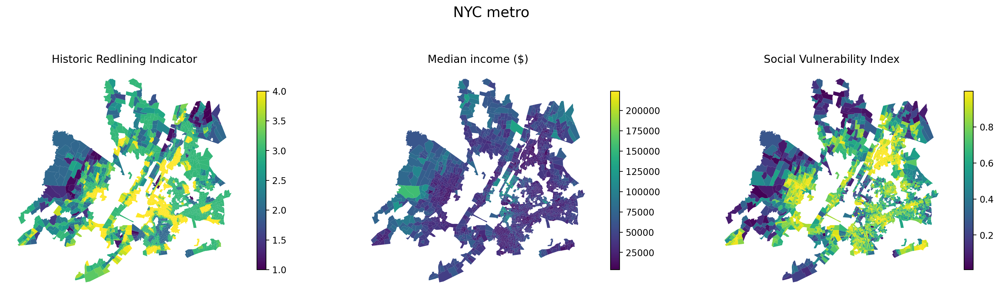

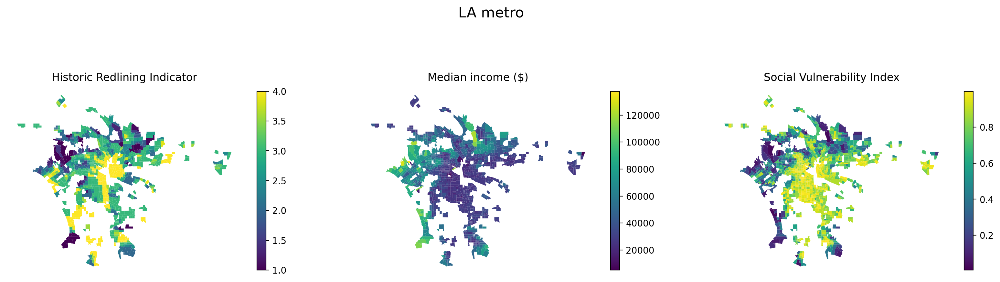

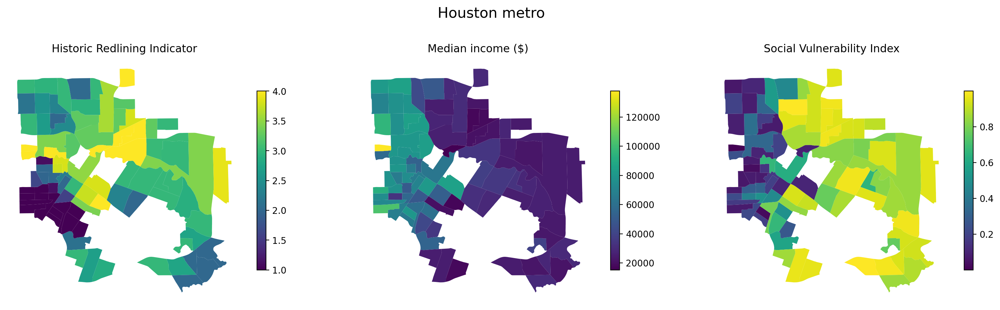

In [27]:
for label, gdf in metro_areas.items():
    joined_gdf = gpd.GeoDataFrame(
        gdf.set_index("GEOID20")[["HRI2020", "geometry"]].join(median_income_df).join(social_vuln_df["RPL_THEMES"]),
        crs=gdf.crs,
    )
    fig, axes = plt.subplots(1, 3, figsize=(20, 60))
    kwds = dict(legend_kwds={'shrink': 0.06}, legend=True)
    joined_gdf.plot(column="HRI2020", ax=axes[0], **kwds)
    joined_gdf.plot(column="median_income", ax=axes[1], **kwds)
    joined_gdf.plot(column="RPL_THEMES", ax=axes[2], **kwds)

    axes[0].set_title("Historic Redlining Indicator")
    axes[1].set_title("Median income ($)")
    axes[2].set_title("Social Vulnerability Index")
    fig.suptitle(f"{label} metro", y=0.54, fontsize=16)

    for ax in axes:
        ax.set_axis_off()